# Problem Statement

Predict assessed property value for the purpose of property tax assessment
Here, we have data of properties collected by a Municipal Council for the purpose of 
computation of assessed value and assessment of property tax within the framework of state 
laws. An individual tax lot may range from multiple buildings to just one residential or 
commercial unit in a condominium.
Therefore the idea is to achieve consistent, rational and objective assessment of properties 
based on a predictive model by automating the property valuation process to reduce the 
unfairness within the tax system.

In [1]:
import numpy as np # numpy used for mathematical operation on array
import pandas as pd  # pandas used for data manipulation on dataframe
import seaborn as sns   # seaborn used for data visualization
import matplotlib.pyplot as plt # matplotlib used for data visualization 
from pandas_profiling import ProfileReport   # to summarise the dataset


In [2]:
test=pd.read_csv(r"C:\Users\ankit\OneDrive\Desktop\New folder\Test-1665386517573.csv")

In [3]:
train=pd.read_csv(r"C:\Users\ankit\OneDrive\Desktop\New folder\Train-1665386529049.csv")

In [4]:
train.head()

,PropertyID,Borough,State,Surroundings,Address,ZipCode,Block,Lot,BldgClassCategory,NoOfResidentialUnits,NoOfCommercialUnits,TotalNoOfUnits,LandAreaInSqFt,GrossAreaInSqFt,YearOfConstruction,TaxClass_AtEvaluationTime,BldgClass_AtEvaluationTime,DateOfEvaluation,PropertyEvaluationvalue
0,PR11101,1,NY,BATHGATE,1473 CROTONA PLACE,10456,2927,127,02 TWO FAMILY DWELLINGS,2,0,2,1900,2394,1990,1,B1,30-05-2014,540000
1,PR11102,1,NY,BATHGATE,453 EAST 181,10457,3037,110,03 THREE FAMILY DWELLINGS,3,0,3,1687,3037,2002,1,C0,13-09-2014,750000
2,PR11103,1,NY,BATHGATE,511 EAST 171 STREET,10457,2912,155,02 TWO FAMILY DWELLINGS,2,0,2,2000,2400,1989,1,B1,28-09-2014,470000
3,PR11104,1,NY,BATHGATE,547 CLAREMONT PARKWAY,10457,2929,134,02 TWO FAMILY DWELLINGS,2,0,2,2356,2394,1991,1,B1,05-06-2014,570000
4,PR11105,1,NY,BATHGATE,2063 WASHINGTON AVENUE,10457,3036,140,02 TWO FAMILY DWELLINGS,2,0,2,3346,2308,1993,1,B1,07-02-2015,640000


In [5]:
test.head()

,PropertyID,Borough,State,Surroundings,Address,ZipCode,Block,Lot,BldgClassCategory,NoOfResidentialUnits,NoOfCommercialUnits,TotalNoOfUnits,LandAreaInSqFt,GrossAreaInSqFt,YearOfConstruction,TaxClass_AtEvaluationTime,BldgClass_AtEvaluationTime,DateOfEvaluation
0,PR51101,1,NY,BATHGATE,3860 3 AVENUE,10457,2929,117,02 TWO FAMILY HOMES,2,0,2,2498,2394,1995,1,B1,24-06-2013
1,PR51102,1,NY,BATHGATE,455 E. 179TH STREET,10457,3036,65,02 TWO FAMILY DWELLINGS,2,0,2,2033,2340,1994,1,B1,28-08-2014
2,PR51103,1,NY,BATHGATE,4415 3 AVENUE,10457,3048,51,14 RENTALS - 4-10 UNIT,4,1,5,2500,6000,1963,2,S4,31-01-2015
3,PR51104,1,NY,BATHGATE,407 EAST 174 STREET,10457,2899,34,30 WAREHOUSES,0,1,1,3439,3320,1951,4,E1,12-03-2015
4,PR51105,1,NY,EAST TREMONT,2175 CROTONA AVENUE,10457,3083,40,03 THREE FAMILY DWELLINGS,3,0,3,1348,2931,1997,1,C0,07-06-2014


In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16810 entries, 0 to 16809
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   PropertyID                  16810 non-null  object
 1   Borough                     16810 non-null  int64 
 2   State                       16810 non-null  object
 3   Surroundings                16810 non-null  object
 4   Address                     16810 non-null  object
 5   ZipCode                     16810 non-null  int64 
 6   Block                       16810 non-null  int64 
 7   Lot                         16810 non-null  int64 
 8   BldgClassCategory           16810 non-null  object
 9   NoOfResidentialUnits        16810 non-null  int64 
 10  NoOfCommercialUnits         16810 non-null  int64 
 11  TotalNoOfUnits              16810 non-null  int64 
 12  LandAreaInSqFt              16810 non-null  int64 
 13  GrossAreaInSqFt             16810 non-null  in

In [7]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2936 entries, 0 to 2935
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   PropertyID                  2936 non-null   object
 1   Borough                     2936 non-null   int64 
 2   State                       2936 non-null   object
 3   Surroundings                2936 non-null   object
 4   Address                     2936 non-null   object
 5   ZipCode                     2936 non-null   int64 
 6   Block                       2936 non-null   int64 
 7   Lot                         2936 non-null   int64 
 8   BldgClassCategory           2936 non-null   object
 9   NoOfResidentialUnits        2936 non-null   int64 
 10  NoOfCommercialUnits         2936 non-null   int64 
 11  TotalNoOfUnits              2936 non-null   int64 
 12  LandAreaInSqFt              2936 non-null   int64 
 13  GrossAreaInSqFt             2936 non-null   int6

In [7]:
all = pd.concat([train, test], sort = False)
all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19746 entries, 0 to 2935
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   PropertyID                  19746 non-null  object 
 1   Borough                     19746 non-null  int64  
 2   State                       19746 non-null  object 
 3   Surroundings                19746 non-null  object 
 4   Address                     19746 non-null  object 
 5   ZipCode                     19746 non-null  int64  
 6   Block                       19746 non-null  int64  
 7   Lot                         19746 non-null  int64  
 8   BldgClassCategory           19746 non-null  object 
 9   NoOfResidentialUnits        19746 non-null  int64  
 10  NoOfCommercialUnits         19746 non-null  int64  
 11  TotalNoOfUnits              19746 non-null  int64  
 12  LandAreaInSqFt              19746 non-null  int64  
 13  GrossAreaInSqFt             1974

In [8]:
all.head()

,PropertyID,Borough,State,Surroundings,Address,ZipCode,Block,Lot,BldgClassCategory,NoOfResidentialUnits,NoOfCommercialUnits,TotalNoOfUnits,LandAreaInSqFt,GrossAreaInSqFt,YearOfConstruction,TaxClass_AtEvaluationTime,BldgClass_AtEvaluationTime,DateOfEvaluation,PropertyEvaluationvalue
0,PR11101,1,NY,BATHGATE,1473 CROTONA PLACE,10456,2927,127,02 TWO FAMILY DWELLINGS,2,0,2,1900,2394,1990,1,B1,30-05-2014,540000.0
1,PR11102,1,NY,BATHGATE,453 EAST 181,10457,3037,110,03 THREE FAMILY DWELLINGS,3,0,3,1687,3037,2002,1,C0,13-09-2014,750000.0
2,PR11103,1,NY,BATHGATE,511 EAST 171 STREET,10457,2912,155,02 TWO FAMILY DWELLINGS,2,0,2,2000,2400,1989,1,B1,28-09-2014,470000.0
3,PR11104,1,NY,BATHGATE,547 CLAREMONT PARKWAY,10457,2929,134,02 TWO FAMILY DWELLINGS,2,0,2,2356,2394,1991,1,B1,05-06-2014,570000.0
4,PR11105,1,NY,BATHGATE,2063 WASHINGTON AVENUE,10457,3036,140,02 TWO FAMILY DWELLINGS,2,0,2,3346,2308,1993,1,B1,07-02-2015,640000.0


In [9]:
ProfileReport(all)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
for i in all.columns:
    print(all[i].value_counts())


PR11101    1
PR24262    1
PR24269    1
PR24268    1
PR24267    1
          ..
PR17682    1
PR17681    1
PR17680    1
PR17679    1
PR54036    1
Name: PropertyID, Length: 19746, dtype: int64
5    7377
3    5813
2    3410
1    1992
4    1154
Name: Borough, dtype: int64
NY    19746
Name: State, dtype: int64
FLUSHING-NORTH              920
GREAT KILLS                 667
BAYSIDE                     534
CANARSIE                    423
ELTINGVILLE                 405
                           ... 
CO-OP CITY                    2
UPPER EAST SIDE (96-110)      2
NEW BRIGHTON-ST. GEORGE       1
FRESH KILLS                   1
BRONX PARK                    1
Name: Surroundings, Length: 244, dtype: int64
102 WEST 57TH STREET     134
102 WEST 57TH ST          48
550 VANDERBILT AVENUE     41
131-01 40TH ROAD          40
242 BROOME STREET         40
                        ... 
1660 DECATUR STREET        1
918 CYPRESS AVENUE         1
1827 PALMETTO STREET       1
63-34 FRESH POND ROAD      1
608 WES

In [12]:
#no. of unique values in each column
features = all.columns
for feature in features:
    print(f"{feature} ---> {all[feature].nunique()}")


PropertyID ---> 19746
Borough ---> 5
State ---> 1
Surroundings ---> 244
Address ---> 17730
ZipCode ---> 174
Block ---> 6841
Lot ---> 1396
BldgClassCategory ---> 52
NoOfResidentialUnits ---> 74
NoOfCommercialUnits ---> 19
TotalNoOfUnits ---> 79
LandAreaInSqFt ---> 4194
GrossAreaInSqFt ---> 3550
YearOfConstruction ---> 72
TaxClass_AtEvaluationTime ---> 3
BldgClass_AtEvaluationTime ---> 104
DateOfEvaluation ---> 582
PropertyEvaluationvalue ---> 3694


In [13]:
#list of all the numerical columns
num_features=all._get_numeric_data().columns
print(num_features)
print("The total number of numerical features are:",len(num_features))


Index(['Borough', 'ZipCode', 'Block', 'Lot', 'NoOfResidentialUnits',
       'NoOfCommercialUnits', 'TotalNoOfUnits', 'LandAreaInSqFt',
       'GrossAreaInSqFt', 'YearOfConstruction', 'TaxClass_AtEvaluationTime',
       'PropertyEvaluationvalue'],
      dtype='object')
The total number of numerical features are: 12


In [14]:
#list of all the categorical features
cat_features=[i for i in all.columns if all.dtypes[i]=='object']
print(cat_features)
print("The total number of categorical features are:",len(cat_features))


['PropertyID', 'State', 'Surroundings', 'Address', 'BldgClassCategory', 'BldgClass_AtEvaluationTime', 'DateOfEvaluation']
The total number of categorical features are: 7


# Data Preprocessing

In [15]:
all.drop('State', axis=1,inplace=True)

In [16]:
all.head()

,PropertyID,Borough,Surroundings,Address,ZipCode,Block,Lot,BldgClassCategory,NoOfResidentialUnits,NoOfCommercialUnits,TotalNoOfUnits,LandAreaInSqFt,GrossAreaInSqFt,YearOfConstruction,TaxClass_AtEvaluationTime,BldgClass_AtEvaluationTime,DateOfEvaluation,PropertyEvaluationvalue
0,PR11101,1,BATHGATE,1473 CROTONA PLACE,10456,2927,127,02 TWO FAMILY DWELLINGS,2,0,2,1900,2394,1990,1,B1,30-05-2014,540000.0
1,PR11102,1,BATHGATE,453 EAST 181,10457,3037,110,03 THREE FAMILY DWELLINGS,3,0,3,1687,3037,2002,1,C0,13-09-2014,750000.0
2,PR11103,1,BATHGATE,511 EAST 171 STREET,10457,2912,155,02 TWO FAMILY DWELLINGS,2,0,2,2000,2400,1989,1,B1,28-09-2014,470000.0
3,PR11104,1,BATHGATE,547 CLAREMONT PARKWAY,10457,2929,134,02 TWO FAMILY DWELLINGS,2,0,2,2356,2394,1991,1,B1,05-06-2014,570000.0
4,PR11105,1,BATHGATE,2063 WASHINGTON AVENUE,10457,3036,140,02 TWO FAMILY DWELLINGS,2,0,2,3346,2308,1993,1,B1,07-02-2015,640000.0


In [17]:
#check null values
all.isnull().sum()



PropertyID                       0
Borough                          0
Surroundings                     0
Address                          0
ZipCode                          0
Block                            0
Lot                              0
BldgClassCategory                0
NoOfResidentialUnits             0
NoOfCommercialUnits              0
TotalNoOfUnits                   0
LandAreaInSqFt                   0
GrossAreaInSqFt                  0
YearOfConstruction               0
TaxClass_AtEvaluationTime        0
BldgClass_AtEvaluationTime       0
DateOfEvaluation                 0
PropertyEvaluationvalue       2936
dtype: int64

<AxesSubplot:>

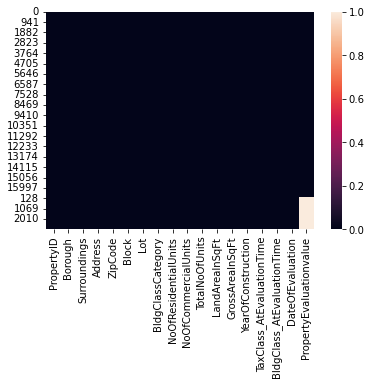

In [18]:
#check null values using visualization
sns.heatmap(all.isnull())

In [19]:
#to check for any particular sign/symbol in all columns
for col in all.columns:
         print(col,all[col][all[col] == '*|?|&|$|%'].count())


PropertyID 0
Borough 0
Surroundings 0
Address 0
ZipCode 0
Block 0
Lot 0
BldgClassCategory 0
NoOfResidentialUnits 0
NoOfCommercialUnits 0
TotalNoOfUnits 0
LandAreaInSqFt 0
GrossAreaInSqFt 0
YearOfConstruction 0
TaxClass_AtEvaluationTime 0
BldgClass_AtEvaluationTime 0
DateOfEvaluation 0
PropertyEvaluationvalue 0


In [20]:
#Descriptive Analysis
all.describe()

,Borough,ZipCode,Block,Lot,NoOfResidentialUnits,NoOfCommercialUnits,TotalNoOfUnits,LandAreaInSqFt,GrossAreaInSqFt,YearOfConstruction,TaxClass_AtEvaluationTime,PropertyEvaluationvalue
count,19746.000000,19746.000000,19746.000000,19746.000000,19746.000000,19746.000000,19746.000000,1.974600e+04,1.974600e+04,19746.000000,19746.000000,1.681000e+04
mean,3.431176,10866.069736,5389.887015,268.283855,1.831611,0.137648,1.969260,1.093834e+04,3.678799e+03,1974.200041,1.292515,8.084101e+05
std,1.393996,523.654412,3692.221515,545.397573,7.603957,2.070227,8.028054,5.578851e+04,1.606472e+04,23.648840,0.717697,8.978317e+05
min,1.000000,10001.000000,6.000000,1.000000,0.000000,0.000000,1.000000,1.000000e+00,1.000000e+00,1941.000000,1.000000,1.000440e+05
25%,2.000000,10312.000000,2398.250000,25.000000,1.000000,0.000000,1.000000,2.100000e+03,1.224000e+03,1951.000000,1.000000,4.250000e+05
50%,3.000000,11206.000000,5015.000000,52.000000,1.000000,0.000000,1.000000,3.200000e+03,1.744000e+03,1970.000000,1.000000,5.900000e+05
75%,5.000000,11364.000000,7346.750000,138.000000,2.000000,0.000000,2.000000,5.000000e+03,2.448000e+03,1998.000000,1.000000,8.450000e+05
max,5.000000,11694.000000,16314.000000,5323.000000,437.000000,252.000000,437.000000,5.612000e+06,1.172005e+06,2012.000000,4.000000,9.935000e+06


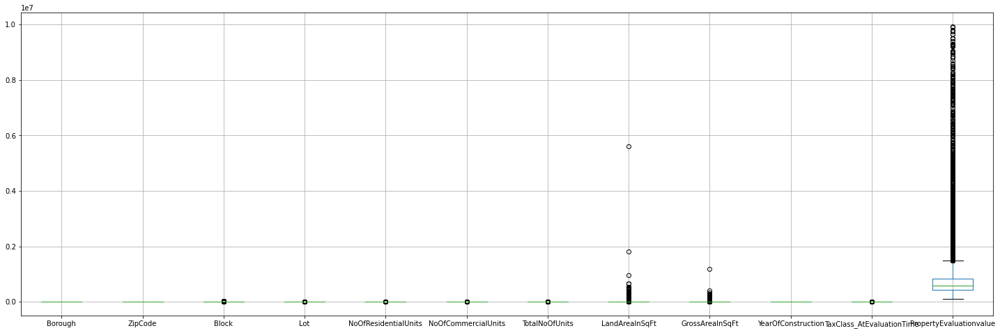

In [21]:
# check outliers
all.boxplot(figsize=(25,8))
plt.show()


# Multicollinearity check

In [22]:
m=all.corr()

In [23]:
m

,Borough,ZipCode,Block,Lot,NoOfResidentialUnits,NoOfCommercialUnits,TotalNoOfUnits,LandAreaInSqFt,GrossAreaInSqFt,YearOfConstruction,TaxClass_AtEvaluationTime,PropertyEvaluationvalue
Borough,1.000000,0.484057,0.312102,0.006326,-0.006911,-0.002175,-0.007106,0.006526,0.010196,-0.170242,0.006911,0.049743
ZipCode,0.484057,1.000000,0.526118,-0.121807,0.016308,-0.001650,0.015021,-0.046298,-0.101317,-0.258191,-0.048104,-0.012603
Block,0.312102,0.526118,1.000000,-0.238587,-0.007144,-0.025218,-0.013270,-0.046357,-0.091353,-0.269225,-0.235457,-0.186906
Lot,0.006326,-0.121807,-0.238587,1.000000,-0.026935,-0.002075,-0.026047,0.248865,-0.053776,0.339960,0.279765,0.207938
NoOfResidentialUnits,-0.006911,0.016308,-0.007144,-0.026935,1.000000,0.074440,0.966369,0.046761,0.450155,0.006300,0.033637,0.098409
NoOfCommercialUnits,-0.002175,-0.001650,-0.025218,-0.002075,0.074440,1.000000,0.328381,0.620902,0.577601,0.024812,0.231003,0.068230
TotalNoOfUnits,-0.007106,0.015021,-0.013270,-0.026047,0.966369,0.328381,1.000000,0.204405,0.575323,0.012365,0.091430,0.110843
LandAreaInSqFt,0.006526,-0.046298,-0.046357,0.248865,0.046761,0.620902,0.204405,1.000000,0.419694,0.020240,0.087332,0.034867
GrossAreaInSqFt,0.010196,-0.101317,-0.091353,-0.053776,0.450155,0.577601,0.575323,0.419694,1.000000,0.096533,0.350991,0.068621
YearOfConstruction,-0.170242,-0.258191,-0.269225,0.339960,0.006300,0.024812,0.012365,0.020240,0.096533,1.000000,0.219901,0.113079


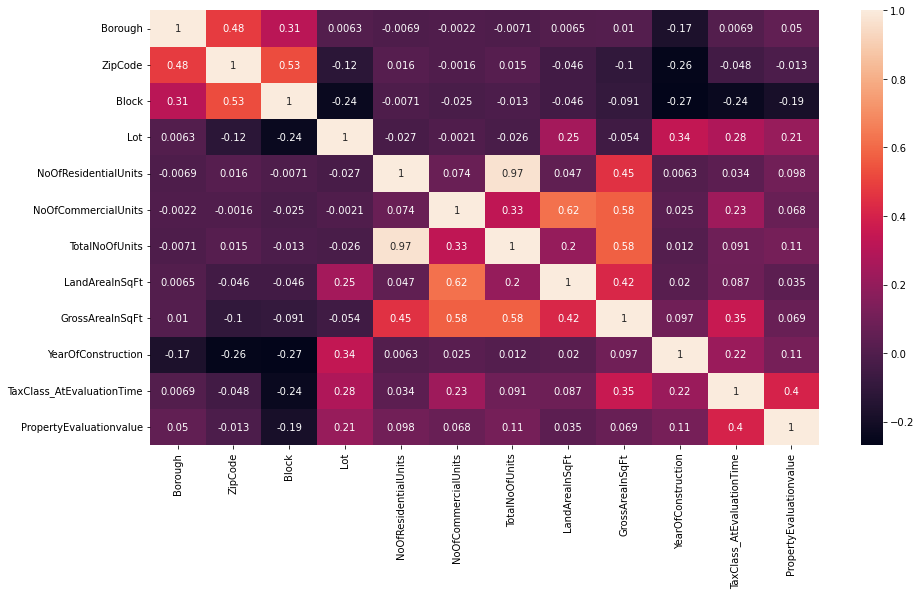

In [24]:
#correlation heatmap
plt.figure(figsize = (15,8))
sns.heatmap(all.corr(), annot=True)
plt.show()


In [26]:
for i in range(0,m.shape[0]):
    for j in range(0,m.shape[1]):
        values = m.iloc[i, j]
        if values>0.7:
            if m.columns[i]!=m.index.values[j]:
                print(m.columns[i],m.index.values[j])


NoOfResidentialUnits TotalNoOfUnits
TotalNoOfUnits NoOfResidentialUnits


In [27]:
x_num = all[['Borough', 'ZipCode', 'Block', 'Lot',"NoOfResidentialUnits",
       'NoOfCommercialUnits', 'TotalNoOfUnits', 'LandAreaInSqFt',
       'GrossAreaInSqFt', 'YearOfConstruction', 'TaxClass_AtEvaluationTime',
       ]]

In [28]:
#Check VIF for each column 

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_data = pd.DataFrame()
vif_data["feature"] = x_num.columns
vif_data["VIF"] = [variance_inflation_factor(x_num.values, i) for i in range(len(x_num.columns))]

vif_data.sort_values("VIF",ascending=False)


C:\Users\ankit\anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


,feature,VIF
4,NoOfResidentialUnits,inf
5,NoOfCommercialUnits,inf
6,TotalNoOfUnits,inf
1,ZipCode,654.648169
9,YearOfConstruction,560.905999
0,Borough,9.567523
10,TaxClass_AtEvaluationTime,6.094257
2,Block,4.787247
8,GrossAreaInSqFt,2.622845
7,LandAreaInSqFt,2.040916


In [29]:
all.drop('Address', axis=1,inplace=True)

In [30]:
all.head()

,PropertyID,Borough,Surroundings,ZipCode,Block,Lot,BldgClassCategory,NoOfResidentialUnits,NoOfCommercialUnits,TotalNoOfUnits,LandAreaInSqFt,GrossAreaInSqFt,YearOfConstruction,TaxClass_AtEvaluationTime,BldgClass_AtEvaluationTime,DateOfEvaluation,PropertyEvaluationvalue
0,PR11101,1,BATHGATE,10456,2927,127,02 TWO FAMILY DWELLINGS,2,0,2,1900,2394,1990,1,B1,30-05-2014,540000.0
1,PR11102,1,BATHGATE,10457,3037,110,03 THREE FAMILY DWELLINGS,3,0,3,1687,3037,2002,1,C0,13-09-2014,750000.0
2,PR11103,1,BATHGATE,10457,2912,155,02 TWO FAMILY DWELLINGS,2,0,2,2000,2400,1989,1,B1,28-09-2014,470000.0
3,PR11104,1,BATHGATE,10457,2929,134,02 TWO FAMILY DWELLINGS,2,0,2,2356,2394,1991,1,B1,05-06-2014,570000.0
4,PR11105,1,BATHGATE,10457,3036,140,02 TWO FAMILY DWELLINGS,2,0,2,3346,2308,1993,1,B1,07-02-2015,640000.0


In [31]:
features = all.columns
for feature in features:
    print(f"{feature} ---> {all[feature].nunique()}")

PropertyID ---> 19746
Borough ---> 5
Surroundings ---> 244
ZipCode ---> 174
Block ---> 6841
Lot ---> 1396
BldgClassCategory ---> 52
NoOfResidentialUnits ---> 74
NoOfCommercialUnits ---> 19
TotalNoOfUnits ---> 79
LandAreaInSqFt ---> 4194
GrossAreaInSqFt ---> 3550
YearOfConstruction ---> 72
TaxClass_AtEvaluationTime ---> 3
BldgClass_AtEvaluationTime ---> 104
DateOfEvaluation ---> 582
PropertyEvaluationvalue ---> 3694


In [32]:
all.drop('Block', axis=1,inplace=True)

In [33]:
all.head()

,PropertyID,Borough,Surroundings,ZipCode,Lot,BldgClassCategory,NoOfResidentialUnits,NoOfCommercialUnits,TotalNoOfUnits,LandAreaInSqFt,GrossAreaInSqFt,YearOfConstruction,TaxClass_AtEvaluationTime,BldgClass_AtEvaluationTime,DateOfEvaluation,PropertyEvaluationvalue
0,PR11101,1,BATHGATE,10456,127,02 TWO FAMILY DWELLINGS,2,0,2,1900,2394,1990,1,B1,30-05-2014,540000.0
1,PR11102,1,BATHGATE,10457,110,03 THREE FAMILY DWELLINGS,3,0,3,1687,3037,2002,1,C0,13-09-2014,750000.0
2,PR11103,1,BATHGATE,10457,155,02 TWO FAMILY DWELLINGS,2,0,2,2000,2400,1989,1,B1,28-09-2014,470000.0
3,PR11104,1,BATHGATE,10457,134,02 TWO FAMILY DWELLINGS,2,0,2,2356,2394,1991,1,B1,05-06-2014,570000.0
4,PR11105,1,BATHGATE,10457,140,02 TWO FAMILY DWELLINGS,2,0,2,3346,2308,1993,1,B1,07-02-2015,640000.0


In [34]:
all.drop('DateOfEvaluation', axis=1,inplace=True)

# Data Visualization

In [35]:
train.head()

,PropertyID,Borough,State,Surroundings,Address,ZipCode,Block,Lot,BldgClassCategory,NoOfResidentialUnits,NoOfCommercialUnits,TotalNoOfUnits,LandAreaInSqFt,GrossAreaInSqFt,YearOfConstruction,TaxClass_AtEvaluationTime,BldgClass_AtEvaluationTime,DateOfEvaluation,PropertyEvaluationvalue
0,PR11101,1,NY,BATHGATE,1473 CROTONA PLACE,10456,2927,127,02 TWO FAMILY DWELLINGS,2,0,2,1900,2394,1990,1,B1,30-05-2014,540000
1,PR11102,1,NY,BATHGATE,453 EAST 181,10457,3037,110,03 THREE FAMILY DWELLINGS,3,0,3,1687,3037,2002,1,C0,13-09-2014,750000
2,PR11103,1,NY,BATHGATE,511 EAST 171 STREET,10457,2912,155,02 TWO FAMILY DWELLINGS,2,0,2,2000,2400,1989,1,B1,28-09-2014,470000
3,PR11104,1,NY,BATHGATE,547 CLAREMONT PARKWAY,10457,2929,134,02 TWO FAMILY DWELLINGS,2,0,2,2356,2394,1991,1,B1,05-06-2014,570000
4,PR11105,1,NY,BATHGATE,2063 WASHINGTON AVENUE,10457,3036,140,02 TWO FAMILY DWELLINGS,2,0,2,3346,2308,1993,1,B1,07-02-2015,640000


In [36]:
train.nlargest(5,"PropertyEvaluationvalue")

,PropertyID,Borough,State,Surroundings,Address,ZipCode,Block,Lot,BldgClassCategory,NoOfResidentialUnits,NoOfCommercialUnits,TotalNoOfUnits,LandAreaInSqFt,GrossAreaInSqFt,YearOfConstruction,TaxClass_AtEvaluationTime,BldgClass_AtEvaluationTime,DateOfEvaluation,PropertyEvaluationvalue
11169,PR22270,4,NY,HARLEM-EAST,138-142 EAST 112TH ST,10029,1639,57,08 RENTALS - ELEVATOR APARTMENTS,21,0,21,10814,23553,2004,2,D3,20-03-2013,9935000
13690,PR24791,5,NY,SUNNYSIDE,43-24 QUEENS BOULEVARD,11104,168,31,22 STORE BUILDINGS,0,8,8,9500,8521,1954,4,K1,07-05-2014,9900000
8897,PR19998,2,NY,BENSONHURST,1549 86TH STREET,11228,6341,15,22 STORE BUILDINGS,0,1,1,43050,9660,1962,4,K1,26-12-2012,9800000
11197,PR22298,4,NY,UPPER WEST SIDE (59-79),"219 WEST 77TH STREET, THEW",10024,1169,1202,13 CONDOS - ELEVATOR APARTMENTS,1,0,1,7663,3806,2011,2,R4,28-12-2014,9750000
13814,PR24915,5,NY,MASPETH,59-41 MAURICE AVENUE,11378,2657,60,30 WAREHOUSES,0,1,1,37850,46045,1948,4,E1,19-07-2013,9750000


Property ID PR22270 has largest PropertyEvaluationvalue.

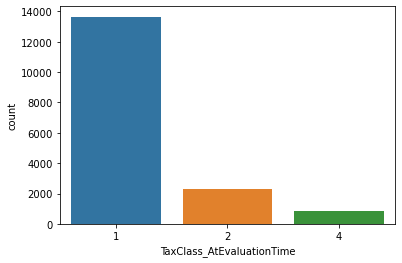

In [37]:
sns.countplot(x="TaxClass_AtEvaluationTime",data=train)
plt.show()

Most of the property comes under ClassTax 1.

In [49]:
grp = train.groupby('TaxClass_AtEvaluationTime')
grp['PropertyEvaluationvalue'].agg([np.size,np.sum, np.mean, np.std]).sort_values("mean",ascending=False).head()

,size,sum,mean,std
TaxClass_AtEvaluationTime,,,,
4,851,1601185334,1.881534e+06,2.032635e+06
2,2314,3463310311,1.496677e+06,1.553696e+06
1,13645,8524878683,6.247621e+05,3.749341e+05


TaxClass 4 has largest mean PropertyEvaluationvalue and TaxClass 1 has lowest mean PropertyEvaluationvalue.

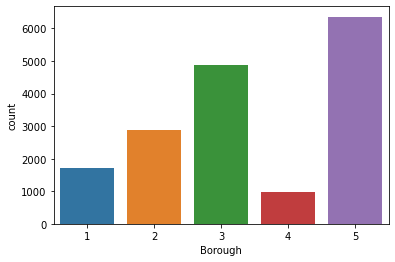

In [39]:
sns.countplot(x="Borough",data=train)
plt.show()

Borough 5 are maximum in the newyork city.

In [48]:
grp = train.groupby('Borough')
grp['PropertyEvaluationvalue'].agg([np.size,np.sum, np.mean, np.std]).sort_values("mean",ascending=False).head()

,size,sum,mean,std
Borough,,,,
4,967,1921421420,1.986992e+06,1.954581e+06
2,2895,2816802016,9.729886e+05,9.857473e+05
5,6362,5057023166,7.948795e+05,7.503925e+05
1,1707,1100394776,6.446367e+05,7.874612e+05
3,4879,2693732950,5.521076e+05,3.560527e+05


Borough 4 has highest PropertyEvaluationvalue and Borough 3 has lowest.

In [50]:
grp = train.groupby('Surroundings')
grp['PropertyEvaluationvalue'].agg([np.size,np.sum, np.mean, np.std]).sort_values("mean",ascending=False).head()

,size,sum,mean,std
Surroundings,,,,
CIVIC CENTER,16,86310544,5394409.0,2.188166e+06
HARLEM-UPPER,1,5000000,5000000.0,NaN
UPPER WEST SIDE (96-116),4,19372500,4843125.0,2.904843e+06
CARROLL GARDENS,4,18075000,4518750.0,3.155641e+06
ALPHABET CITY,2,8650000,4325000.0,2.722361e+06


Properties which have surrounding CIVIC CENTER have highest mean PropertyEvaluationvalue.

In [51]:
grp = train.groupby('BldgClassCategory')
grp['PropertyEvaluationvalue'].agg([np.size,np.sum, np.mean, np.std]).sort_values("mean",ascending=False).head()

,size,sum,mean,std
BldgClassCategory,,,,
26 OTHER HOTELS,2,13850000,6.925000e+06,1.308148e+06
36 OUTDOOR RECREATIONAL FACILITIES,2,12100000,6.050000e+06,1.484924e+06
08 RENTALS - ELEVATOR APARTMENTS,44,215955071,4.908070e+06,2.875726e+06
35 INDOOR PUBLIC AND CULTURAL FACILITIES,4,17445000,4.361250e+06,3.457553e+06
08 RENTALS - ELEVATOR APARTMENTS,14,60892482,4.349463e+06,2.822061e+06


Properties which have BldgClassCategory as 26 OTHER HOTELS are costly.

In [47]:
grp = train.groupby('ZipCode')
grp['PropertyEvaluationvalue'].agg([np.size,np.sum, np.mean, np.std]).sort_values("mean",ascending=False).head()

,size,sum,mean,std
ZipCode,,,,
10007,9,46955544,5.217283e+06,2.688261e+06
10013,15,75498000,5.033200e+06,2.610836e+06
10031,1,5000000,5.000000e+06,NaN
10034,4,17823062,4.455766e+06,3.592125e+06
10014,9,39969190,4.441021e+06,1.745677e+06


Areas with ZIPCode 10007 are costly.

In [46]:
grp = train.groupby('BldgClass_AtEvaluationTime')
grp['PropertyEvaluationvalue'].agg([np.size,np.sum, np.mean, np.std]).sort_values("mean",ascending=False).head()

,size,sum,mean,std
BldgClass_AtEvaluationTime,,,,
I7,1,7400000,7400000.0,NaN
D3,6,37926606,6321101.0,2.204497e+06
D6,3,18842217,6280739.0,2.684438e+06
Q9,2,12100000,6050000.0,1.484924e+06
H9,1,6000000,6000000.0,NaN


BldgClass I7 has highest PropertyEvaluationvalue

In [52]:
#correlation of all input variable with output
all.corr()["PropertyEvaluationvalue"]  

Borough                      0.049743
ZipCode                     -0.012603
Lot                          0.207938
NoOfResidentialUnits         0.098409
NoOfCommercialUnits          0.068230
TotalNoOfUnits               0.110843
LandAreaInSqFt               0.034867
GrossAreaInSqFt              0.068621
YearOfConstruction           0.113079
TaxClass_AtEvaluationTime    0.402181
PropertyEvaluationvalue      1.000000
Name: PropertyEvaluationvalue, dtype: float64

As you can see from above PropertyEvaluationvalue is very much dependent on TaxClass Variable

# Converting categorical to numerical

In [37]:
#to convert all categorical columns into dummies
all = pd.get_dummies(all,columns = ["Surroundings","BldgClassCategory","BldgClass_AtEvaluationTime","ZipCode","YearOfConstruction"],drop_first = True)


In [40]:
all.head()

,PropertyID,Borough,Lot,NoOfResidentialUnits,NoOfCommercialUnits,TotalNoOfUnits,LandAreaInSqFt,GrossAreaInSqFt,TaxClass_AtEvaluationTime,PropertyEvaluationvalue,...,YearOfConstruction_2003,YearOfConstruction_2004,YearOfConstruction_2005,YearOfConstruction_2006,YearOfConstruction_2007,YearOfConstruction_2008,YearOfConstruction_2009,YearOfConstruction_2010,YearOfConstruction_2011,YearOfConstruction_2012
0,PR11101,1,127,2,0,2,1900,2394,1,540000.0,...,0,0,0,0,0,0,0,0,0,0
1,PR11102,1,110,3,0,3,1687,3037,1,750000.0,...,0,0,0,0,0,0,0,0,0,0
2,PR11103,1,155,2,0,2,2000,2400,1,470000.0,...,0,0,0,0,0,0,0,0,0,0
3,PR11104,1,134,2,0,2,2356,2394,1,570000.0,...,0,0,0,0,0,0,0,0,0,0
4,PR11105,1,140,2,0,2,3346,2308,1,640000.0,...,0,0,0,0,0,0,0,0,0,0


# separating train and test data

In [41]:
all_train = all[all['PropertyEvaluationvalue'].notna()]
all_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16810 entries, 0 to 16809
Columns: 651 entries, PropertyID to YearOfConstruction_2012
dtypes: float64(1), int64(8), object(1), uint8(641)
memory usage: 11.7+ MB


In [42]:
all_test = all[all['PropertyEvaluationvalue'].isna()]
all_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2936 entries, 0 to 2935
Columns: 651 entries, PropertyID to YearOfConstruction_2012
dtypes: float64(1), int64(8), object(1), uint8(641)
memory usage: 2.0+ MB


In [43]:
#separating input output in train data
x=all_train.drop(['PropertyEvaluationvalue',"PropertyID"],axis=1)
y=all_train['PropertyEvaluationvalue']


In [44]:
x.head()

,Borough,Lot,NoOfResidentialUnits,NoOfCommercialUnits,TotalNoOfUnits,LandAreaInSqFt,GrossAreaInSqFt,TaxClass_AtEvaluationTime,Surroundings_ALPHABET CITY,Surroundings_ANNADALE,...,YearOfConstruction_2003,YearOfConstruction_2004,YearOfConstruction_2005,YearOfConstruction_2006,YearOfConstruction_2007,YearOfConstruction_2008,YearOfConstruction_2009,YearOfConstruction_2010,YearOfConstruction_2011,YearOfConstruction_2012
0,1,127,2,0,2,1900,2394,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,110,3,0,3,1687,3037,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,155,2,0,2,2000,2400,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,134,2,0,2,2356,2394,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,140,2,0,2,3346,2308,1,0,0,...,0,0,0,0,0,0,0,0,0,0


# Model Building

In [45]:
#train_test split
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [46]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


In [60]:
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor(n_estimators=500)
rf.fit(x_train,y_train)
y_predict=rf.predict(x_test)



In [61]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [62]:
R2= r2_score(y_test, y_predict)*100

In [63]:
R2

67.5933880959597

In [71]:
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [73]:
print("MAPE:", mean_absolute_percentage_error(y_test,y_predict), "%")

MAPE: 29.27041574845502 %


In [47]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import SGDRegressor


In [48]:
models={
    "Random Forest":RandomForestRegressor(random_state=42),
    "Decision Tree":DecisionTreeRegressor(),
    "KNeighbors Regressor":KNeighborsRegressor(),
    "SV Regressor":SVR(),
    "Gradient Boost":GradientBoostingRegressor(),
    "XG Boost":XGBRegressor(),
    "SGD Regressor":SGDRegressor(),
    "Ridge Regressor":Ridge(),
    "Lasso Regressor":Lasso(),
    "Linear Regression":LinearRegression()
}

dict={"Model":[],
      "train_MAE":[],
      "train_MSE":[],
      "train_R2":[],
      "test_MAE":[],
      "test_MSE":[],
      "test_R2":[]
     }
result=pd.DataFrame(dict)
for i in range(len(list(models))):
    model=list(models.values())[i]
    model.fit(x_train,y_train) #Train Model
    
    #make prediction
    y_train_pred=model.predict(x_train)
    y_test_pred=model.predict(x_test)
    
    #training set performance
    train_MAE= mean_absolute_error(y_train, y_train_pred)
    train_MSE=mean_squared_error(y_train, y_train_pred)
    train_R2= r2_score(y_train, y_train_pred)*100
    
    
    #test set performance
    test_MAE= mean_absolute_error(y_test, y_test_pred)
    test_MSE= mean_squared_error(y_test, y_test_pred)
    test_R2= r2_score(y_test, y_test_pred)*100
   
    
    m={"Model":list(models.keys())[i],"train_MAE":train_MAE,"train_MSE":train_MSE,
         "train_R2":train_R2,
        "test_MAE":test_MAE,"test_MSE":test_MSE,"test_R2":test_R2,
        }
    result=result.append(m,ignore_index=True)
result.sort_values("test_R2",ascending=False)


C:\Users\ankit\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.912e+15, tolerance: 1.053e+12
  model = cd_fast.enet_coordinate_descent(


,Model,train_MAE,train_MSE,train_R2,test_MAE,test_MSE,test_R2
0,Random Forest,7.559425e+04,3.624771e+10,9.536859e+01,1.990980e+05,2.800768e+11,6.886662e+01
5,XG Boost,1.412075e+05,6.183296e+10,9.209953e+01,2.037879e+05,2.955474e+11,6.714690e+01
4,Gradient Boost,2.414282e+05,2.074157e+11,7.349824e+01,2.625190e+05,3.512071e+11,6.095976e+01
1,Decision Tree,4.161609e+03,3.229030e+09,9.958742e+01,2.577496e+05,4.375686e+11,5.135980e+01
2,KNeighbors Regressor,2.449116e+05,2.464101e+11,6.851587e+01,3.172608e+05,4.753473e+11,4.716031e+01
7,Ridge Regressor,2.501212e+05,2.905995e+11,6.286974e+01,2.880320e+05,6.707673e+11,2.543739e+01
8,Lasso Regressor,2.492213e+05,2.836818e+11,6.375362e+01,2.923571e+05,6.844526e+11,2.391613e+01
3,SV Regressor,4.008169e+05,8.308727e+11,-6.161639e+00,3.940447e+05,9.437573e+11,-4.908220e+00
9,Linear Regression,2.492811e+05,2.833499e+11,6.379603e+01,3.152802e+05,1.091527e+12,-2.133428e+01
6,SGD Regressor,1.456876e+18,3.653437e+37,-4.668042e+27,1.687776e+18,2.264871e+38,-2.517634e+28


# HyperParameter Tuning Random Forest

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

# Number of trees in random forest
n_estimators = [500,800]
# Number of features to consider at every split
max_features = ['auto']
# Maximum number of levels in tree
# Minimum number of samples required to split a node
min_samples_split = [2, 5]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2]
# Method of selecting samples for training each tree
bootstrap = [True]
max_samples=[0.7,None]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
               "max_samples":max_samples
              }
print(random_grid)

# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rfc_rs=rf_random.fit(x_train, y_train)

y_predict=rfc_rs.predict(x_test)

# find the best score
rfc_rs.best_score_



#best parameters selected
rfc_rs.best_params_


{'n_estimators': [500, 800], 'max_features': ['auto'], 'min_samples_split': [2, 5], 'min_samples_leaf': [1, 2], 'bootstrap': [True], 'max_samples': [0.7, None]}
Fitting 3 folds for each of 16 candidates, totalling 48 fits


C:\Users\ankit\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:306: UserWarning: The total space of parameters 16 is smaller than n_iter=100. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


In [68]:
y_predict

array([602748.77625, 483121.355  , 350608.19875, ..., 920157.3275 ,
       418878.37375, 565656.5    ])

In [69]:
test_R2= r2_score(y_test, y_predict)*100

In [70]:
test_R2

67.76728030024506

In [72]:
all_test.head()

,PropertyID,Borough,Lot,NoOfCommercialUnits,TotalNoOfUnits,LandAreaInSqFt,GrossAreaInSqFt,YearOfConstruction,TaxClass_AtEvaluationTime,YearOfEvaluation,PropertyEvaluationvalue
0,PR51101,-1.744078,-0.277390,-0.066491,0.003829,-0.151296,-0.079978,0.879556,-0.407585,-0.664231,NaN
1,PR51102,-1.744078,-0.372735,-0.066491,0.003829,-0.159631,-0.083340,0.837270,-0.407585,0.450878,NaN
2,PR51103,-1.744078,-0.398405,0.416560,0.377528,-0.151260,0.144494,-0.473610,0.985796,1.565986,NaN
3,PR51104,-1.744078,-0.429576,0.416560,-0.120737,-0.134428,-0.022335,-0.981047,3.772558,1.565986,NaN
4,PR51105,-1.744078,-0.418575,-0.066491,0.128396,-0.171910,-0.046550,0.964129,-0.407585,0.450878,NaN


In [64]:
TestForPred = all_test.drop(['PropertyID', 'PropertyEvaluationvalue'], axis = 1)

In [65]:
t_pred = rf.predict(TestForPred).astype(float)

In [66]:
PropertyID= all_test['PropertyID']

In [68]:
RF_Sub = pd.DataFrame({'PropertyID': PropertyID, 'PropertyEvaluationvalue':t_pred})


In [69]:
RF_Sub

,PropertyID,PropertyEvaluationvalue
0,PR51101,4.060431e+05
1,PR51102,4.776719e+05
2,PR51103,1.628149e+06
3,PR51104,1.284377e+06
4,PR51105,7.068160e+05
...,...,...
2931,PR54032,8.796484e+05
2932,PR54033,4.444122e+06
2933,PR54034,4.109390e+06
2934,PR54035,3.145098e+06


In [70]:
RF_Sub.to_csv("RF_Class_Submission.csv", index = False)